## Introduction
Object detection is a fundamental task in computer vision. The problem of object recognition essentially consists of first localizing the object and then classifying it with a semantic label. In recent deep learning based methods, YOLO is an extremely fast real time multi object detection algorithm.  
  
<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_1.png"/></div>
<center>Figure 1: This is a demo of what object detection does. The color indicates different semantic class.</center>  
  
The dataset was made up of 10K street scene images with the training and validation split as 80%-20% (along with their correponding labels). The image dimension is $128 \times 128 \times 3$, and the labels include the semantic class and the bounding box corresponding to each object in the image. 

A small portion of these ground-truth labels are a little bit noisy and the quantity of the training set is not very large, so we embark on this journey of implementing YOLO with prior knowledge that the detector is not a super robust object detector.

## Data Preprocessing Stage

First, we download and load the dataset from these links to the code directory -

Images -
https://drive.google.com/file/d/1A1MKUMBiEddBBdGWWSPizSgxWoRx5BCy/view?usp=sharing

Labels - 
https://drive.google.com/file/d/1SHoig7JrnyxHIlY3d8xoic9SnWYRzaD-/view?usp=sharing

In [1]:
#images.npz
!gdown 1A1MKUMBiEddBBdGWWSPizSgxWoRx5BCy
#labels.npz
!gdown 1SHoig7JrnyxHIlY3d8xoic9SnWYRzaD-

Downloading...
From: https://drive.google.com/uc?id=1A1MKUMBiEddBBdGWWSPizSgxWoRx5BCy
To: /content/images.npz
100% 363M/363M [00:01<00:00, 203MB/s]
Downloading...
From: https://drive.google.com/uc?id=1SHoig7JrnyxHIlY3d8xoic9SnWYRzaD-
To: /content/labels.npz
100% 593k/593k [00:00<00:00, 129MB/s]


The format of the labels are (class, $x_1$, $y_1$, $x_2$, $y_2$), where $x_1$, $y_1$ are the top left corner of the bounding box and $x_2$, $y_2$ are the bottom right corner of the bounding box.  
  
<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_2.png"/></div>
<center>Figure 2: This figure demonstrates the format of ground-truth labels that YOLO algorithm requires.</center>  
  
For each image, we need to convert the provided labels into the $8 \times 8 \times 8$ ground truth matrix, which has the same dimension as the output of YOLO detection network. The conversion is as follows:
* We consider a $16 \times 16$ image patch as a grid cell and thus divide the full image into $8 \times 8$ patches in the 2D spatial dimension. In the output activation space, one grid cell represents one 16x16 image patch with corresponding aligned locations.
* For simplified YOLO, we only use one anchor box, where we assume the anchor size is the same as the grid cell size. If the center of an object falls into a grid cell, that grid cell is responsible for detecting that object. This means that there is only one anchor for each object instance.
* For each anchor, there are 8 channels, which encode Pr(Objectness), $x$, $y$, $w$, $h$, P(class=pedestrian),  P(class=traffic light), and P(class=car).
* The Pr(Objectness) is the probability of whether this anchor is an object or background. When assigning the ground-truth for this value, "1" indicates object and "0" indicates background.
* The channels 2-5, $x$, $y$ coordinates represent the center of the box relative to the bounds of the grid cell; $w$, $h$ is relative to the image width and height.
* In channels 6-8, you need to convert the ground truth semantic label of each object into one-hot coding for each anchor boxes.
* Note that if the anchor box does not have any object (Pr=0), you don't need to assign any values to channels 2-8, since we will not use them during training.
* The dimensions are ordered (channels, x, y).

## Model Architecture
You are required to implement the model architecture using the following parameters. This model takes input with dimension of $128 \times 128 \times 3$ and outputs an activation with dimension of $8 \times 8 \times 8$.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_3.png"/></div>
<center>Figure 3: This figure demonstrates how to compute IoU.</center>

| Layer | Hyperparameters |
| :-: | :-: |
| conv1 | Kernel size $= 4 \times 4 \times 32$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv2 | Kernel size $= 4 \times 4 \times 64$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv3 | Kernel size $= 4 \times 4 \times 128$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv4 | Kernel size $= 4 \times 4 \times 256$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv5 | Kernel size $= 4 \times 4 \times 512$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv6 | Kernel size $= 4 \times 4 \times 1024$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| transposed_conv7 | Kernel size $= 4 \times 4 \times 256$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| transposed_conv8 | Kernel size $= 4 \times 4 \times 64$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv9 | Kernel size $= 3 \times 3 \times 8$, stride $=1$, pad $=1$. |


## Training Details
During training, the localization and classification errors are optimized jointly. The loss function is shown
as below.  $i$ indicates number of grid cells and $j$ indicates number of anchor boxes at each grid cell. In our
case, there is only one anchor box at each grid cell and $B = 1$.

$$ \text{Loss} = 
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(x_i - \hat{x}_i\right)}^2 + {\left(y_i - \hat{y}_i\right)}^2\right]} + 
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(\sqrt{w_i} - \sqrt{\hat{w}_i}\right)}^2 + {\left(\sqrt{h_i} - \sqrt{\hat{h}_i}\right)}^2\right]} + 
{\sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left(C_i - \hat{C}_i\right)^2} + 
{\lambda_\text{no obj} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{no obj} \left(C_i - \hat{C}_i\right)^2} + 
{\sum_{i=0}^{S^2} \mathbb{1}_{ij}^\text{obj} \sum_{c\, \in\, \text{classes}} \left(p_i(c) - \hat{p}_i(c)\right)^2}$$

* In our case there is only one anchor box at each grid, hence $B = 1$.
* $S^2 =$ total number of grid cells.
* $\mathbb{1}_{ij}^\text{obj} = 1$ if an object appears in grid cell $i$ and 0 otherwise.
* $\mathbb{1}_{ij}^\text{no obj}$ is the compliment of $\mathbb{1}_{ij}^\text{obj}$.
* $\hat{C}_i =$ Box confidence score $=$ Pr(box contains object) $\times$ IoU
* IoU $=$ Intersection over union between the predicted and the ground truth.
* $\hat{p}_i(c) =$ conditional class probability of class $c$ in cell $i$.

$\lambda_\text{coord}$ and and $\lambda_\text{no obj}$ are two hyperparameters for coordinate predictions and non-objectness classification. We set $\lambda_\text{coord} = 5$ and and $\lambda_\text{no obj} = 0.5$.

Each grid cell predicts 1 bounding box, confidence score for those boxes and class conditional probabilities.

The confidence Score reflects the degree of confidence that the box contains an object and how accurate the box is. If no object exists in the cell then the confidence score should be 0 else the confidence score should be equal to the IOU between the predicted box and the ground truth box.

During training, you can set learning rate of 10e-3 using Adam optimizer with default beta 1 and beta 2. You are encourage to adaptively adjust learning rate during training to see if the model will converge better. You should also visualize the loss over training iterations. You will need to decide at the iteration to stop training based on the loss visualization. (At least 20 epochs of training is required.)

## Post-Processing
During inference, the network is going to predict lots of overlapping redundant bounding boxes. To eliminate the redundant boxes, there are basically two steps:

1. Get rid of predicted boxes with low objectness probability (Pr $< 0.6$).
2. For each class, calculate the IoU for all the bounding boxes and cluster boxes with IoU > 0.5 as a group. For each group, find the one with highest Pr and suppress the other boxes. This is referred as non-max suppression.

To evaluate the performance of your YOLO implementation, compute the mean Average Precision (mAP) of inference. Predicted bounding boxes are a match with ground truth bounding boxes if they share the same label and have an IoU with the ground truth bounding box of greater than 0.5. These matches can be used to calculate a precision/recall curve for each class. The Average Precision for a class is the area under this curve. The mean of these Average Precision values over all the classes in inference gives the mean Average Precision of your network.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_4.png"/></div>
<center>Figure 4: This figure demonstrates post-process of how to get rid of redundant bounding box.</center>

## Code

In [3]:
!pip install pytorch_lightning &> /dev/null

import matplotlib.pyplot as plt
from matplotlib import patches
import numpy as np
import torch
import torch.nn as nn
import pytorch_lightning as pl
from sklearn import metrics
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
import torch.nn.functional as F
from pytorch_lightning.loggers import tensorboard
import torchvision


# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
seed = 17
torch.manual_seed(seed);

In [4]:
# Use this function to import the provided data files
def load_data(file_name):
    return np.load(file_name, allow_pickle=True, encoding='latin1')['arr_0']

images = load_data('images.npz')
raw_labels = load_data('labels.npz')

In [5]:
print("Images : ",images.shape)
print("Labels : ",type(raw_labels))

Images :  (9900, 128, 128, 3)
Labels :  <class 'numpy.ndarray'>


In [6]:
# %%timeit
# This function should compute the 8X8X8 label from the raw labels for the corresponding image.
def process_labels(raw_labels):

  labels = []

  for i, one_raw_label in enumerate(raw_labels):
    one_label = np.zeros((8, 8, 8))
    
    centres = np.zeros((one_raw_label.shape[0], 7))          # Centres (x_mid, y_mid, grid_x_centre, grid_y_centre, w, h, class encoding)
    grid_centres = np.zeros((one_raw_label.shape[0], 2))     # Grid centres (grid_index_x, grid_index_y)
    one_hot_enc = np.zeros((one_raw_label.shape[0], 3))

    centres[:,0] = (one_raw_label[:,1] + one_raw_label[:,3])/2       # x_mid
    centres[:,1] = (one_raw_label[:,2] + one_raw_label[:,4])/2       # y_mid

    centres[:,2:4] = (centres[:,:2] % 16)/16                              # Object grid centre (x y)
    centres[:,4] = (one_raw_label[:,3] - one_raw_label[:,1])/128           # w
    centres[:,5] = (one_raw_label[:,4] - one_raw_label[:,2])/128           # h

    obj_class = one_raw_label[:,0].astype(int).reshape(-1,1)               # Object Classes

    one_hot_enc = np.where(obj_class==0, np.array([1,0,0]), one_hot_enc)      # Encoding
    one_hot_enc = np.where(obj_class==1, np.array([0,1,0]), one_hot_enc)
    one_hot_enc = np.where(obj_class==2, np.array([0,0,1]), one_hot_enc)

    grid_centres = centres[:,:2] // 16                             # Grid index

    final_centres = np.hstack((centres, grid_centres))

    obj_ind = final_centres[:,7:9].astype(int)                  
    one_label[0, obj_ind[:,0], obj_ind[:,1]] = 1                  # Populating the label array
    one_label[1, obj_ind[:,0], obj_ind[:,1]] = final_centres[:, 2]
    one_label[2, obj_ind[:,0], obj_ind[:,1]] = final_centres[:, 3]
    one_label[3, obj_ind[:,0], obj_ind[:,1]] = final_centres[:, 4]
    one_label[4, obj_ind[:,0], obj_ind[:,1]] = final_centres[:, 5]
    one_label[5, obj_ind[:,0], obj_ind[:,1]] = one_hot_enc[:,0]
    one_label[6, obj_ind[:,0], obj_ind[:,1]] = one_hot_enc[:,1]
    one_label[7, obj_ind[:,0], obj_ind[:,1]] = one_hot_enc[:,2]

    labels.append(one_label)
  labels = np.array(labels)
  return labels

labels = process_labels(raw_labels)

In [7]:
# This function should perform the inverse operation of process_labels().
def reconstruct_raw_labels(labels, conf=False, thr=0., img_dim=128):
    raw_labels = []
    for lbl_idx in range(0, len(labels)):
      vect = np.empty(0)
      one_raw_label = np.empty(0)
      # find in channel 1 which elements have Pr(objectness) == 1. If it does have 1, then return the indices
      # print("Here : ", labels)
    
      r,c = np.where(labels[lbl_idx][0] > thr)
          

      for k in range(0,len(r)):
        # Put entire row of channels in a single vector
        vect_channels = np.array(labels[lbl_idx][:, r[k], c[k]])

        # convert one-hot to integer
        onehot_to_int = np.argmax(vect_channels[len(vect_channels)-3: len(vect_channels)])
        onehot_val = np.max(vect_channels[len(vect_channels)-3: len(vect_channels)])
       

        # The channels 2, 3 -  x ,  y  coordinates represent the center of the box relative to the bounds of the grid cell
        # 4, 5 - w , h  is relative to the image width and height.
        xc = (vect_channels[1]+r[k])*16
        yc = (vect_channels[2]+c[k])*16
        w = vect_channels[3]*img_dim
        h = vect_channels[4]*img_dim

        x_ul = xc - w/2
        y_ul = yc - h/2
        x_br = xc + w/2
        y_br = yc + h/2

        # Generate one raw label
        if conf:
          one_raw_label = np.append(one_raw_label, np.array([onehot_to_int, x_ul, y_ul, x_br, y_br, labels[lbl_idx,0, r[k], c[k]]]))
        else:
          one_raw_label = np.append(one_raw_label, np.array([onehot_to_int, x_ul, y_ul, x_br, y_br]))
     
      if conf:
        one_raw_label = np.reshape(one_raw_label, (len(r), 6))
      else:
        one_raw_label = np.reshape(one_raw_label, (len(r), 5))
        
      # Append that one raw label to list of raw labels and return
      raw_labels.append(one_raw_label)

    return raw_labels

reconstructed_raw_labels = reconstruct_raw_labels(labels)

In [8]:
def yolo_loss(output, target):
  # Batch size (N, 8, 8, 8)
  N = output.shape[0]
  # iou = torch.zeros(N, 8, 8)

  ##### CUDA ######
  output = output.to(device)
  target = target.to(device)
  iou = torch.zeros(N, 8, 8).to(device)

  for i in range(N):

    idx_target = target[i,0,:,:] != 0.

    # Calculating IOU
    xc_target, yc_target = torch.where(target[i,0,:,:] != 0.)

    if len(xc_target) != 0:

      x_target = (torch.transpose(target[i,:,idx_target,],0, 1)[:,1]+xc_target)*16
      y_target = (torch.transpose(target[i,:,idx_target,],0, 1)[:,2]+yc_target)*16
      w_target = torch.transpose(target[i,:,idx_target,],0, 1)[:,3]*128
      h_target = torch.transpose(target[i,:,idx_target,],0, 1)[:,4]*128

      x_output = (torch.transpose(output[i,:,idx_target,],0, 1)[:,1]+xc_target)*16
      y_output = (torch.transpose(output[i,:,idx_target,],0, 1)[:,2]+yc_target)*16
      w_output = torch.transpose(output[i,:,idx_target,],0, 1)[:,3]*128
      h_output = torch.transpose(output[i,:,idx_target,],0, 1)[:,4]*128

      x_right_output_corner = (x_output + w_output/2)
      x_left_output_corner = (x_output - w_output/2)
      y_right_output_corner = (y_output + h_output/2)
      y_left_output_corner = (y_output - h_output/2)

      x_right_target_corner = (x_target + w_target/2)
      x_left_target_corner = (x_target - w_target/2)
      y_right_target_corner = (y_target + h_target/2)
      y_left_target_corner = (y_target - h_target/2)

      x_right_cood = torch.min(torch.hstack(((x_output + w_output/2).view(-1,1), (x_target + w_target/2).view(-1,1))), dim=1)        # Max of top right..returns max x, y coordinate of intersection bounding box
      y_right_cood = torch.min(torch.hstack(((y_output + h_output/2).view(-1,1), (y_target + h_target/2).view(-1,1))), dim=1)

      x_left_cood = torch.max(torch.hstack(((x_output - w_output/2).view(-1,1), (x_target - w_target/2).view(-1,1))), dim=1)         # Min of bottom left..returns min x, y coordinate of intersection bounding box
      y_left_cood = torch.max(torch.hstack(((y_output - h_output/2).view(-1,1), (y_target - h_target/2).view(-1,1))), dim=1)

      intersection_area = (x_right_cood[0] - x_left_cood[0]) * (y_right_cood[0] - y_left_cood[0])
      union_area = (x_right_output_corner - x_left_output_corner)*(y_right_output_corner - y_left_output_corner) + (x_right_target_corner - x_left_target_corner)*(y_right_target_corner - y_left_target_corner) - intersection_area
      iou[i, xc_target, yc_target] = ((intersection_area + 0.00001) / (union_area + 0.00001))                                                                                      # IOU calculation
  
  iou = torch.clamp(iou, min=0.0, max=1.0)
  location_loss_1 = torch.sum(torch.sum(target[:,0]*(torch.square(target[:,1]-output[:,1]) + torch.square(target[:,2]-output[:,2])), -1), -1) 

  location_loss_2 = torch.sum(torch.sum(target[:,0]*(torch.square(target[:,3]**0.5-output[:,3]**0.5) + torch.square(target[:,4]**0.5-output[:,4]**0.5)), -1), -1)

  confidence_loss_1 = torch.sum(torch.sum(target[:,0]*(torch.square(target[:,0]*iou - output[:,0])), -1), -1)

  confidence_loss_2 = torch.sum(torch.sum((1-target[:,0])*torch.square(target[:,0]*iou - output[:,0]), -1), -1)

  classification_loss = torch.sum(torch.sum(target[:, 0] * torch.sum((target[:, 5:] - output[:, 5:])**2, axis=1), -1), -1)

  lambda_coord = 5
  lambda_noobj = 0.5

  loss = lambda_coord*location_loss_1 + lambda_coord*location_loss_2  + confidence_loss_1 + lambda_noobj*confidence_loss_2 + classification_loss

  loss = torch.sum(loss)

  # print("Location loss 1: ", lambda_coord*location_loss_1)
  # print("Location loss 2 : ", lambda_coord*location_loss_2)
  # print("Confidence_loss_1 : ", confidence_loss_1)
  # print("Confidence_loss_2 : ", lambda_noobj*confidence_loss_2)
  # print("Classification loss : ", classification_loss)
  # print("Final loss : ", loss)

  return loss.float()


In [9]:
train_batch_size = 50 
valid_batch_size = 50

class YOLO(pl.LightningModule):
    def __init__(self, learning_rate):
        super().__init__()
        self.learning_rate = learning_rate
        self.train_losses = []
        self.val_losses = []
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=4, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(num_features=32)
        self.relu1 = nn.ReLU()
        
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(num_features=64)
        self.relu2= nn.ReLU()

        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(num_features=128)
        self.relu3 = nn.ReLU()

        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(num_features=256)
        self.relu4 = nn.ReLU()

        self.conv5 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(num_features=512)
        self.relu5 = nn.ReLU()

        self.conv6 = nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=4, stride=2, padding=1)
        self.bn6 = nn.BatchNorm2d(num_features=1024)
        self.relu6 = nn.ReLU()

        self.transposed_conv7 = nn.ConvTranspose2d(in_channels=1024, out_channels=256, kernel_size=4, stride=2, padding=1)
        self.bn7 = nn.BatchNorm2d(num_features=256)
        self.relu7 = nn.ReLU()

        self.transposed_conv8 = nn.ConvTranspose2d(in_channels=256, out_channels=64, kernel_size=4, stride=2, padding=1)
        self.bn8 = nn.BatchNorm2d(num_features=64)
        self.relu8 = nn.ReLU()

        self.conv9 = nn.Conv2d(in_channels=64, out_channels=8, kernel_size=3, stride=1, padding=1)
        self.sig = nn.Sigmoid()

        self.map_list = []
        self.pred = []
        self.pred_epoch = []


    def forward(self, x):
        x = self.relu1(self.bn1(self.conv1(x)))
        x = self.relu2(self.bn2(self.conv2(x)))
        x = self.relu3(self.bn3(self.conv3(x)))
        x = self.relu4(self.bn4(self.conv4(x)))
        x = self.relu5(self.bn5(self.conv5(x)))
        x = self.relu6(self.bn6(self.conv6(x)))
        x = self.relu7(self.bn7(self.transposed_conv7(x)))
        x = self.relu8(self.bn8(self.transposed_conv8(x)))
        x = self.conv9(x)
        x = self.sig(x)
        return x


    def training_step(self, batch, batch_idx):
        X, y = batch

        X = X.clone().detach().view(train_batch_size, 3, 128, 128)
        X = X.type(torch.float32)
        y = y.type(torch.float32)
        y_pred = self.forward(X)

        self.pred.append(y_pred)

        train_loss = yolo_loss(y_pred, y)
        self.train_losses.append(train_loss.detach().item())

        self.log("train_loss", train_loss)

        return train_loss

    
    def training_epoch_end(self, training_step_outputs):
      if len(self.pred) != 0:
        self.pred_epoch.append(self.pred)
      # print("length of the self.pred : ", len(self.pred))
      # print("length of the self.pred epoch: ", len(self.pred_epoch))

      self.pred = []

    
    def validation_step(self, batch, batch_idx):
        X_val, y_val = batch
        X_val = X_val.clone().detach().view(valid_batch_size, 3, 128, 128)
        X_val = X_val.type(torch.float32)
        y_val = y_val.type(torch.float32)

        y_val_pred = self.forward(X_val)
        val_loss = yolo_loss(y_val_pred, y_val)
        # print("Val loss : ", val_loss.mean())
        self.val_losses.append(val_loss.detach().item())
        # tensorboard_logs = {'Val_loss': val_loss}
        self.log("val_loss", val_loss)


    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer



In [10]:
def low_confidence_suppression(label):
  # idx = label[:,0]>0.6
  # label[idx, :] = 0
  # return label
  threshold = 0.6
  return torch.where(label[0,:,:]>threshold, label[:,:,:], 0)
  

def ioU_NMS(box1, box2): # (class, x, y, w, h, confidence)
  x_1 = box1[1]
  y_1 = box1[2]
  w_1 = box1[3]
  h_1 = box1[4]

  x_2 = box2[1]
  y_2 = box2[2]
  w_2 = box2[3]
  h_2 = box2[4]

  x_right_1_corner = (x_1 + w_1/2)
  x_left_1_corner = (x_1 - w_1/2)
  y_right_1_corner = (y_1 + h_1/2)
  y_left_1_corner = (y_1 - h_1/2)

  x_right_2_corner = (x_2 + w_2/2)
  x_left_2_corner =  (x_2 - w_2/2)
  y_right_2_corner = (y_2 + h_2/2)
  y_left_2_corner =  (y_2 - h_2/2)


  x_right_cood = np.min(np.hstack(((x_1 + w_1/2).reshape(-1,1), (x_2 + w_2/2).reshape(-1,1))), axis=1)        # Max of top right..returns max x, y coordinate of intersection bounding box
  y_right_cood = np.min(np.hstack(((y_1 + h_1/2).reshape(-1,1), (y_2 + h_2/2).reshape(-1,1))), axis=1)

  x_left_cood = np.max(np.hstack(((x_1 - w_1/2).reshape(-1,1), (x_2 - w_2/2).reshape(-1,1))), axis=1)         # Min of bottom left..returns min x, y coordinate of intersection bounding box
  y_left_cood = np.max(np.hstack(((y_1 - h_1/2).reshape(-1,1), (y_2 - h_2/2).reshape(-1,1))), axis=1)

  intersection_area = (x_right_cood[0] - x_left_cood[0]) * (y_right_cood[0] - y_left_cood[0])
  union_area = (x_right_1_corner - x_left_1_corner)*(y_right_1_corner - y_left_1_corner) + (x_right_2_corner - x_left_2_corner)*(y_right_2_corner - y_left_2_corner) - intersection_area
  iou = ((intersection_area + 0.00001) / (union_area + 0.00001))                                                                                      # IOU calculation
  
  return iou

def non_max_suppression(label, nms_thres=0.5):
  label_w_conf = reconstruct_raw_labels(label.cpu().detach().numpy(), conf=True, thr=0.6)
  # label_w_conf = reconstruct_raw_labels(label, conf=True, thr=0.6)


  nms_batch = []
  for i, each_label in enumerate(label_w_conf):       # for each image in the batch
    keep_lst_car = []
    keep_lst_tra = []
    keep_lst_ped = []
    ind = np.argsort(each_label[:,-1])
    sorted_each_label = each_label[ind]

    car = [k for k in sorted_each_label if k[0]==2.][::-1]
    traffic_light = [k for k in sorted_each_label if k[0]==1.][::-1]
    person = [k for k in sorted_each_label if k[0]==0.][::-1]

    # print("Car : ", car)
    # print("TL : ", traffic_light)
    # print("Person : ", person)
    car_max = []
    traffic_light_max = []
    person_max = []

    while car != []:
      car_max.append(car.pop(0))
      first = car_max[-1]
      for other_cars in car:
        if ioU_NMS(other_cars, first) > nms_thres:
          array_to_remove = other_cars
          car = [a for a, skip in zip(car, [np.allclose(a, array_to_remove) for a in car]) if not skip]


    while traffic_light != []:
      traffic_light_max.append(traffic_light.pop(0))
      first = traffic_light_max[-1]
      for other_traffic_light in traffic_light:
        if ioU_NMS(other_traffic_light, first) > nms_thres:
          array_to_remove = other_traffic_light
          traffic_light = [a for a, skip in zip(traffic_light, [np.allclose(a, array_to_remove) for a in traffic_light]) if not skip]

    while person != []:
      person_max.append(person.pop(0))
      first = person_max[-1]
      for other_person in person:
        if ioU_NMS(other_person, first) > nms_thres:
          array_to_remove = other_person
          person = [a for a, skip in zip(person, [np.allclose(a, array_to_remove) for a in person]) if not skip]

    nms_batch.append([person_max, traffic_light_max, car_max])
  # print("NMS : ", nms_batch)

  return nms_batch


# low_conf_suppressed = low_confidence_suppression(out_batch)
# nms_res = non_max_suppression(low_conf_suppressed, nms_thres=0.6)

In [11]:
def conv_box(cood):
  # print("Cood : ", cood.shape)
  if np.shape(cood)[0] == 0:
    # print("Return : ", torch.from_numpy(np.array(cood)))
    return torch.from_numpy(np.array(cood))
  box_cood = np.hstack(((cood[:,1]-cood[:,3]/2).reshape(-1,1), (cood[:,2]-cood[:,4]/2).reshape(-1,1), (cood[:,1]+cood[:,3]/2).reshape(-1,1), (cood[:,2]+cood[:,4]/2).reshape(-1,1)))
  return torch.from_numpy(box_cood)

def precision_recall_curve(predictions, targets, target_class):
  # print("predictions : ", len(predictions))
  # print("Target : ", len(targets))
  # targets = torch.from_numpy(targets)
  # targets = targets.cpu().detach().numpy()
  # print("P : ", predictions[0])
  # print("T : ", targets[0])
  target_class = int(target_class)

  thr = 0.5
  tp = 0
  fp = 0
  total_gt_count = 0
  tp_fp = []

  for i, (pred_label, tar_label) in enumerate(zip(predictions, targets)):
    # print("IIIIIIIIIIIIIIIIII : ", i)
    # print("Here : ", tar_label)
    pred_act_label = np.array(pred_label[target_class])
    tar_act_label = tar_label[tar_label[:,0]==target_class]

    # print("Prediction : ", pred_act_label)
    # print("Target : ", tar_act_label)

    if np.shape(pred_act_label)[0] == 0 and np.shape(tar_act_label)[0] != 0:
      # print("Pred : Null array (False Negative)")
      total_gt_count += tar_act_label.shape[0]
      for row in range(tar_act_label.shape[0]):
        tp_fp.append(torch.tensor([tar_act_label[row,-1], 0]))
      continue
    elif np.shape(pred_act_label)[0] != 0 and np.shape(tar_act_label)[0] == 0:
      # print("Pred : Full array (False Positive)")
      for row in range(pred_act_label.shape[0]):
        tp_fp.append(torch.tensor([pred_act_label[row,-1], 1]))
      continue
    elif np.shape(pred_act_label)[0] == 0 and np.shape(tar_act_label)[0] == 0:
      # print("Nothing predicted wih no target")
      continue
    else:
      iou_out = torchvision.ops.box_iou(conv_box(pred_act_label), conv_box(tar_act_label))
      # print("iou : ", iou_out)
      # print(iou_out.numpy().shape)
      gt_tracker = []
      for row in range(iou_out.shape[0]):
        matched_indx = torch.max(iou_out[row, :], axis=0).indices
        matched_val = torch.max(iou_out[row, :], axis=0).values

        if matched_val.item() > thr:
          if matched_indx.item() not in gt_tracker:
            tp_fp.append(torch.tensor([pred_act_label[row,-1], 1]))
            gt_tracker.append(matched_indx.item())
          else:
            tp_fp.append(torch.tensor([pred_act_label[row,-1], 2]))
        else:
          tp_fp.append(torch.tensor([pred_act_label[row,-1], 2]))
      total_gt_count += tar_act_label.shape[0]

  if len(tp_fp) == 0:
    return [0], [0]

  tp_fp_tensor = torch.stack(tp_fp)
  tp_fp_tensor = torch.stack(sorted(tp_fp_tensor, key=lambda tp_fp_tensor: tp_fp_tensor[0]))

  precision = []
  recall = []
  tp = 0
  fp = 0
  fn = 0

  for i, out in enumerate(tp_fp_tensor):
    if out[1].item() == 1:
      tp += 1
    elif out[1].item() == 2:
      fp += 1
    elif out[1].item() == 0:
      fn += 10

    precision_val = tp / (i + 1)
    recall_val = tp / (total_gt_count + 0.00001)
    precision.append(precision_val)
    recall.append(recall_val)


  return recall, precision

def average_precision(predictions, targets, target_class):
    recall, precision = precision_recall_curve(predictions, targets, target_class)
    # print("x : ", recall)
    # print("y : ", precision)
    if len(recall) == 1 :
      average_precision_val = 0
    else:
      average_precision_val = metrics.auc(np.array(recall), np.array(precision))
    return average_precision_val

def mean_average_precision(predictions, targets):
  classes = [0, 1, 2]
  map = 0
  for each_class in classes:
    map += average_precision(predictions, targets, each_class)
  map /= 3
  return map

# re, pr = precision_recall_curve(nms_res, raw_labels[:1000], 0)
# print("AUC : ", average_precision(nms_res, raw_labels[:1000:], 2))
# print("MAP : ", mean_average_precision(nms_res, raw_labels[:1000]))




## Instructions and Evaluation

This project is divided into the following parts:

1. Choose an image that has all three classes present (the image has a car, a person, and a traffic light).
  1. Show the chosen image with ground truth bounding boxes visualized. Use green bounding boxes around cars, red bounding boxes around pedestrians, and blue bounding boxes around traffic lights. See Figure 1 as an example of what this visualization should look like. (3%)
  2. Convert the image labels to an 8x8x8 representation, and show each channel of the processed labels in the report. Label the visualization of each channel with the associated channel number and visualized value. Example: "Channel 1: Pr(Objectness)". (5%)
  3. To test your data preprocessing code, convert your 8x8x8 representation for this step back to the original input data and ensure that your image with recomputed bounding boxes looks the same as the input. Show this image with bounding box visualizations in your report. This test code for data preprocessing will also be needed in the inference step. (2%)

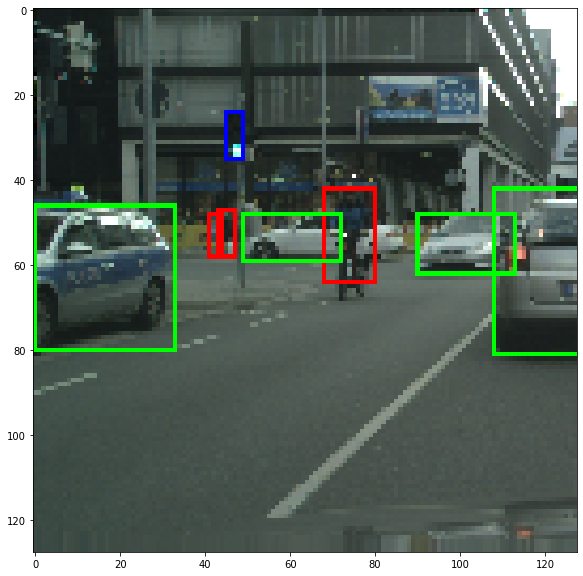

In [12]:
# Show the chosen image with ground truth bounding boxes visualized.
import cv2

for i in range(0, len(raw_labels)):
  if 2 in raw_labels[i][:,0]:
    if 1 in raw_labels[i][:,0]:
      if 0 in raw_labels[i][:,0]:
        img_number = i  #Thus we chose image with label i as it has all 3 classes.
        break

# print(raw_labels[number])
edit_image = images[img_number].copy()

for i in range(0, len(raw_labels[img_number])):
  x_ul = int(raw_labels[img_number][i][1])
  y_ul = int(raw_labels[img_number][i][2])

  x_br = int(raw_labels[img_number][i][3])
  y_br = int(raw_labels[img_number][i][4])

  # green car, red pedestrian, blue traffic light
  if(raw_labels[img_number][i][0] == 0):
    color = (255,0,0)
  if(raw_labels[img_number][i][0] == 1):
    color = (0,0,255)
  if(raw_labels[img_number][i][0] == 2):
    color = (0,255,0)

  edit_image = cv2.rectangle(edit_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (10,10))
plt.imshow(edit_image)

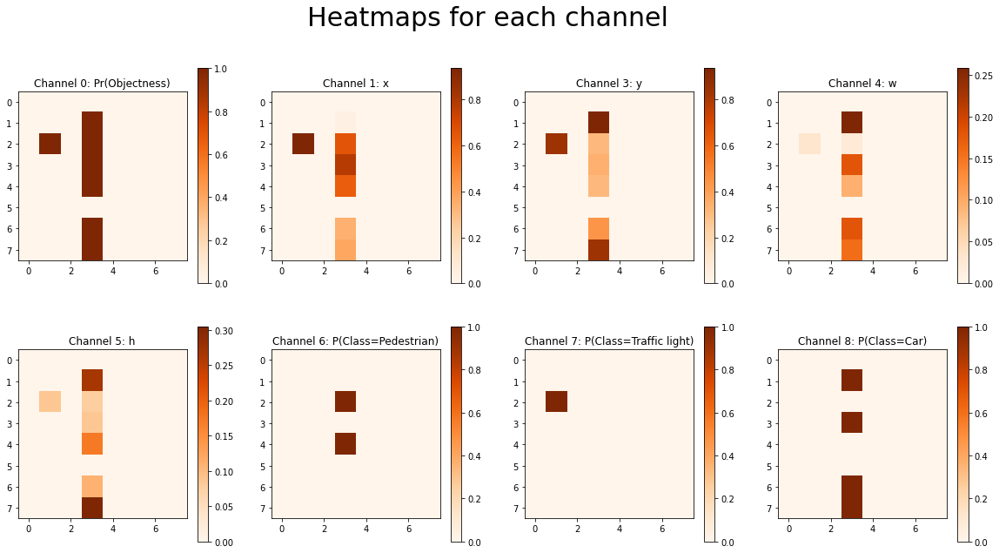

In [13]:
# Visualize the 8x8x8 representation.
fig, axarr = plt.subplots(2,4, figsize=(20, 10))
fig.suptitle('Heatmaps for each channel', fontsize=30)

d00 = axarr[0,0].imshow(labels[img_number][0], cmap="Oranges")
axarr[0,0].set_title(f"Channel 0: Pr(Objectness)")
plt.colorbar(d00, ax=axarr[0,0])

d01 = axarr[0,1].imshow(labels[img_number][1], cmap="Oranges")
axarr[0,1].set_title(f"Channel 1: x")
plt.colorbar(d01, ax=axarr[0,1])

d02 = axarr[0,2].imshow(labels[img_number][2], cmap="Oranges")
axarr[0,2].set_title(f"Channel 3: y")
plt.colorbar(d02, ax=axarr[0,2])

d03 = axarr[0,3].imshow(labels[img_number][3], cmap="Oranges")
axarr[0,3].set_title(f"Channel 4: w")
plt.colorbar(d03, ax=axarr[0,3])

d04 = axarr[1,0].imshow(labels[img_number][4], cmap="Oranges")
axarr[1,0].set_title(f"Channel 5: h")
plt.colorbar(d04, ax=axarr[1,0])

d05 = axarr[1,1].imshow(labels[img_number][5], cmap="Oranges")
axarr[1,1].set_title(f"Channel 6: P(Class=Pedestrian)")
plt.colorbar(d05, ax=axarr[1,1])

d06 = axarr[1,2].imshow(labels[img_number][6], cmap="Oranges")
axarr[1,2].set_title(f"Channel 7: P(Class=Traffic light)")
plt.colorbar(d06, ax=axarr[1,2])

d07 = axarr[1,3].imshow(labels[img_number][7], cmap="Oranges")
axarr[1,3].set_title(f"Channel 8: P(Class=Car)")
plt.colorbar(d07, ax=axarr[1,3])

plt.show() 


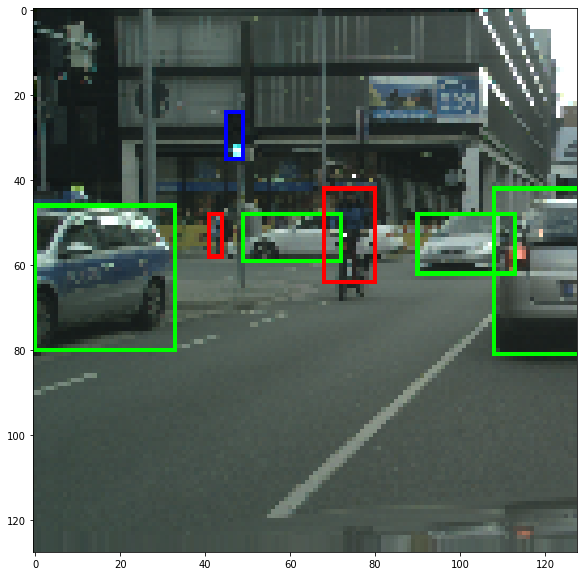

In [14]:
# Convert back to the original representation (test cases below should pass).
# import cv2
reconstructed = reconstruct_raw_labels(labels)

conv_orig = reconstructed[img_number]   
edited_image = images[img_number].copy()
for i in range(0, len(conv_orig)):
  x_ul = int(conv_orig[i][1])
  y_ul = int(conv_orig[i][2])

  x_br = int(conv_orig[i][3])
  y_br = int(conv_orig[i][4])

  # green car, red pedestrian, blue traffic light
  if(conv_orig[i][0] == 0):
    color = (255,0,0)
  if(conv_orig[i][0] == 1):
    color = (0,0,255)
  if(conv_orig[i][0] == 2):
    color = (0,255,0)

  edited_image = cv2.rectangle(edited_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (10,10))
plt.imshow(edited_image)

2. Implement the loss function. (3%)

3. Make block diagram of requested architecture. Label the diagram with the parts of your code which implement each component. Explain any deviations you made from the described architecture. (15%)

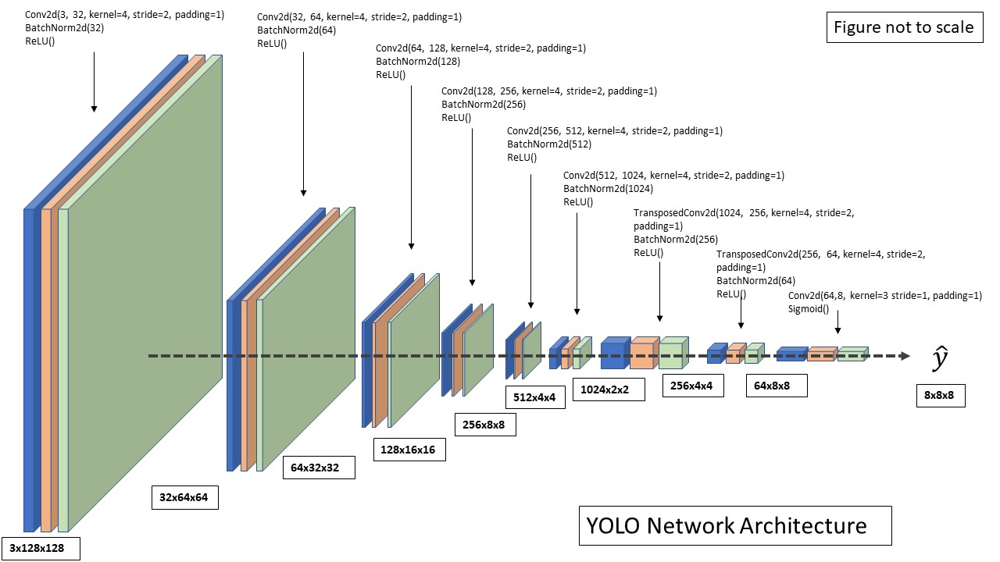

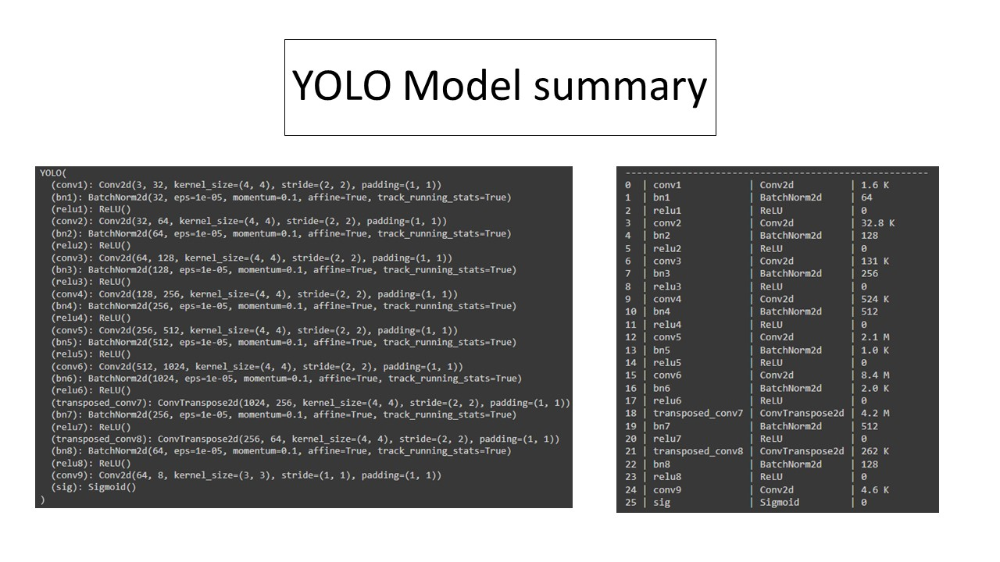

4. Show a plot of the loss over training for your model. (Raw Tensorboard output is not sufficient) (10%) 

In [15]:
train_size = 7500

new_images = torch.as_tensor(images[:9900])
labels_re = torch.as_tensor(labels[:9900])
new_images = new_images.float()

train_data    = new_images[:train_size].to(device)
train_labels  = labels_re[:train_size].to(device)

val_data     = new_images[train_size:9900].to(device)
val_labels   = labels_re[train_size:9900].to(device)

train_set = torch.utils.data.TensorDataset(train_data, train_labels)
train_loader = torch.utils.data.DataLoader(train_set, train_batch_size, shuffle=False )
val_set = torch.utils.data.TensorDataset(val_data, val_labels)
val_loader = torch.utils.data.DataLoader(val_set, valid_batch_size, shuffle=False)


# print("Train : ", len(train_set))
# print("Val : ", len(val_set))

In [16]:
# Setup your training
model = YOLO(learning_rate=0.001)
epochs = 40

logger = pl_loggers.TensorBoardLogger("tb_logs", name="YOLO")
# trainer = pl.Trainer(accelerator='cpu', devices=1, max_epochs=epochs, logger=logger)
trainer = pl.Trainer(accelerator='gpu', devices=1, max_epochs=epochs, logger=logger)
trainer.fit(model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name             | Type            | Params
------------------------------------------------------
0  | conv1            | Conv2d          | 1.6 K 
1  | bn1              | BatchNorm2d     | 64    
2  | relu1            | ReLU            | 0     
3  | conv2            | Conv2d          | 32.8 K
4  | bn2              | BatchNorm2d     | 128   
5  | relu2            | ReLU            | 0     
6  | conv3            | Conv2d          | 131 K 
7  | bn3              | BatchNorm2d     | 256   
8  | relu3            | ReLU            | 0     


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=40` reached.


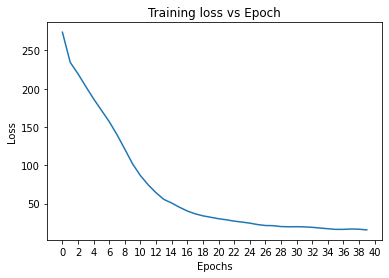

In [18]:
# Plot the results
train_N = len(model.train_losses)
# print("Train N : ", train_N)
train_each_size = int(train_N / epochs)
# print("Train each size : ", train_each_size)
epoch_loss = []

temp = 0
for i in range(train_N):
  temp += model.train_losses[i]
  if i!=0 and i % (train_each_size - 1) == 0:
    epoch_loss.append(temp/train_each_size)
    temp = 0

plt.plot(epoch_loss)
plt.xticks([k for k in range(0,epochs+1,2)])
plt.title("Training loss vs Epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

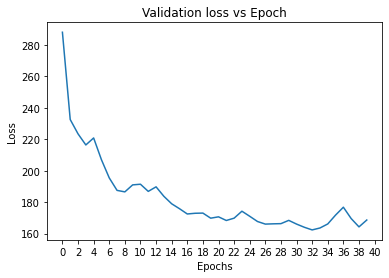

In [19]:
val_N = len(model.val_losses)
# print("Val N : ", val_N)
val_each_size = int(val_N / epochs)
# print("Train each size : ", train_each_size)
epoch_loss = []

temp = 0
for i in range(val_N):
  temp += model.val_losses[i]
  if i!=0 and i % (val_each_size - 1) == 0:
    # print(i)
    epoch_loss.append(temp/val_each_size)
    temp = 0

plt.plot(epoch_loss)
plt.xticks([k for k in range(0,epochs+1,2)])
plt.title("Validation loss vs Epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [20]:
%reload_ext tensorboard
%tensorboard --logdir tb_logs/

<IPython.core.display.Javascript object>

5. Show a plot of the mean Average Precision over training for your model. (10%)

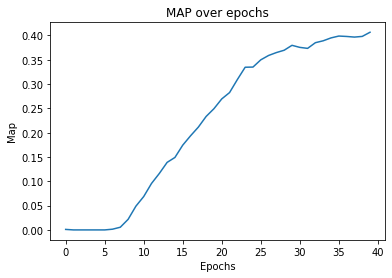

In [21]:
map_epoch = []
for j in range(len(model.pred_epoch)):
  preds = model.pred_epoch[j]
  # print(preds[0][0])
  mappp = 0
  for i in range(len(preds)):  
    nms_res = non_max_suppression(preds[i], nms_thres=0.5)
    mappp += mean_average_precision(nms_res, reconstruct_raw_labels(preds[i].cpu().detach().numpy(), thr=0.5))
  map_epoch.append(mappp/len(preds))
# print(map_epoch)
 

plt.plot(map_epoch)
plt.title("MAP over epochs")
plt.xlabel("Epochs")
plt.ylabel("Map")
plt.show()
  

6. For one image in the inference step, show the predicted bounding boxes in the image before performing any elimination. Then, show the annotated image after the low probability bounding boxes are removed. Finally, show image after performing non-max suppression. Label each of these visualizations. See Figure 4 as an example of what this visualization should look like. (15%)

In [22]:
predictions = model(torch.tensor(images[:100],dtype=torch.float32).reshape(100,3,128,128))

[[], [], [array([  2.        ,   3.83674479,  48.50677967,  70.49548197,
       103.3383646 ,   0.9555108 ]), array([  2.        , 101.68263578,  54.9722538 , 117.66313028,
        68.70559883,   0.76003301])]]
[array([  2.        ,   3.83674479,  48.50677967,  70.49548197,
       103.3383646 ,   0.9555108 ]), array([  2.        , 101.68263578,  54.9722538 , 117.66313028,
        68.70559883,   0.76003301])]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)


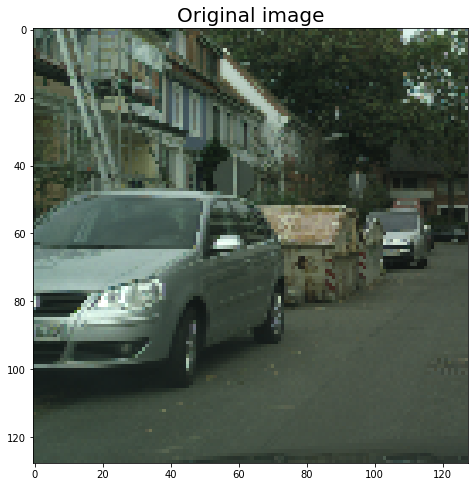

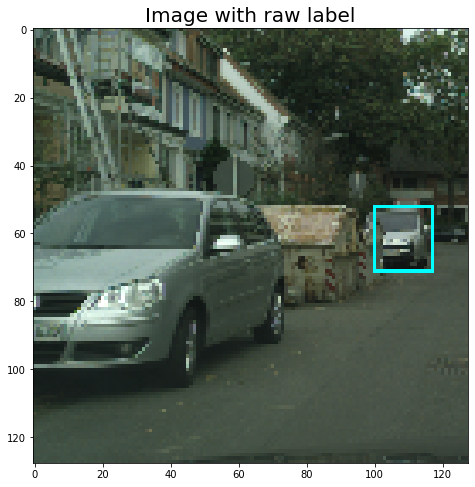

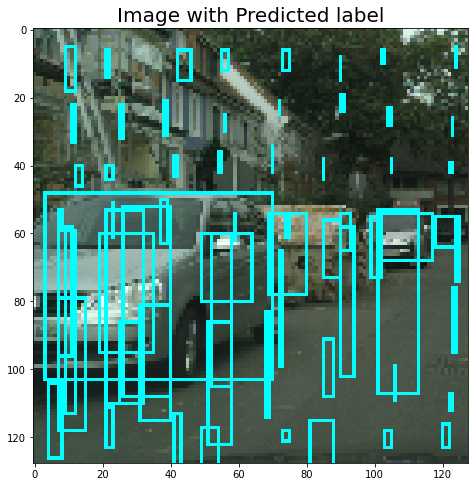

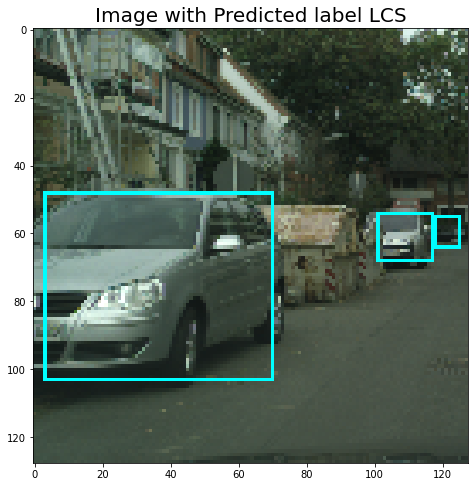

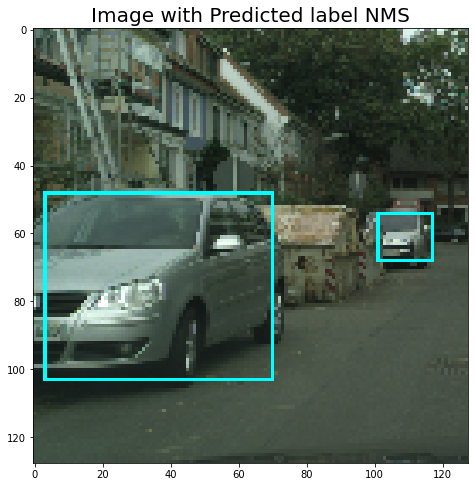

In [23]:
import cv2
disp_img_number = 42
"""
ORIGINAL IMAGE
"""
plt.figure(figsize = (8,8))
plt.title("Original image", size=20)
plt.imshow(images[disp_img_number])


"""
RAW LABELS
"""
image_orig_lab = images[disp_img_number].copy()

for i in range(0, len(raw_labels[disp_img_number])):
  x_ul = int(raw_labels[disp_img_number][i][1])
  y_ul = int(raw_labels[disp_img_number][i][2])

  x_br = int(raw_labels[disp_img_number][i][3])
  y_br = int(raw_labels[disp_img_number][i][4])

  color = (0,255,255)

image_orig_lab = cv2.rectangle(image_orig_lab, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with raw label", size=20)
plt.imshow(image_orig_lab)


"""
RAW PREDICTIONS
"""

predict_lab = reconstruct_raw_labels([predictions[disp_img_number].detach().numpy()], conf=False, thr = 0.00, img_dim=128)

raw_pred_image = images[disp_img_number].copy()

for i in range(0, len(predict_lab[0])):
  # print(predict_lab[0])
  x_ul = int(predict_lab[0][i][1])
  y_ul = int(predict_lab[0][i][2])

  x_br = int(predict_lab[0][i][3])
  y_br = int(predict_lab[0][i][4])

  color = (0,255,255)

  raw_pred_image = cv2.rectangle(raw_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label", size=20)
plt.imshow(raw_pred_image)


"""
LCS PREDICTIONS
"""
lab1 = low_confidence_suppression(predictions[disp_img_number])

lcs_label = reconstruct_raw_labels([lab1.detach().numpy()], conf=False, thr = 0.00, img_dim=128)

lcs_pred_image = images[disp_img_number].copy()

for i in range(0, len(lcs_label[0])):
  # print(predict_lab[0])
  x_ul = int(lcs_label[0][i][1])
  y_ul = int(lcs_label[0][i][2])

  x_br = int(lcs_label[0][i][3])
  y_br = int(lcs_label[0][i][4])
  # print(x_ul)
  # print(y_ul)
  # print(x_br)
  # print(y_br)
  color = (0,255,255)

  lcs_pred_image = cv2.rectangle(lcs_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label LCS", size=20)
plt.imshow(lcs_pred_image)

"""
NMS PREDICTIONS
"""
lab2 = low_confidence_suppression(predictions[disp_img_number])
# print(lab2)
nms_ = non_max_suppression(torch.tensor([lab2.detach().numpy()]), nms_thres=0.0)[0]
print(nms_)
# print(np.shape(nms_))
# print(np.vstack((nms_[0],nms_[2])))
# print(len(nms_[1]))
nms_123 = []
for x in range(0,len(nms_)):
  # print(nms_[x])
  # print(x)
  if len(nms_[x]) == 0:
    continue
  if len(nms_123) == 0:
    nms_123 = nms_[x]
    continue
  nms_123 = np.vstack((nms_123,nms_[x]))
print(nms_123)

# nms_123 = np.vstack((nms_[0],nms_[2]))
nms_pred_image = images[disp_img_number].copy()
# print(nms_123)
for i in range(0, len(nms_123)):
  # print(predict_lab[0])
  x_ul = int(nms_123[i][1])
  y_ul = int(nms_123[i][2])

  x_br = int(nms_123[i][3])
  y_br = int(nms_123[i][4])
  # print(x_ul)
  # print(y_ul)
  # print(x_br)
  # print(y_br)
  color = (0,255,255)

  nms_pred_image = cv2.rectangle(nms_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label NMS", size=20)
plt.imshow(nms_pred_image)


7. For one image in the inference step, show the bounding boxes visualized for each class with green bounding boxes around cars, red bounding boxes around pedestrians, and blue bounding boxes around traffic lights as done in Figure 1. Show the precision/recall curves for each class in inference. Write down the achieved mean Average Precision for your inference stage. (17%)

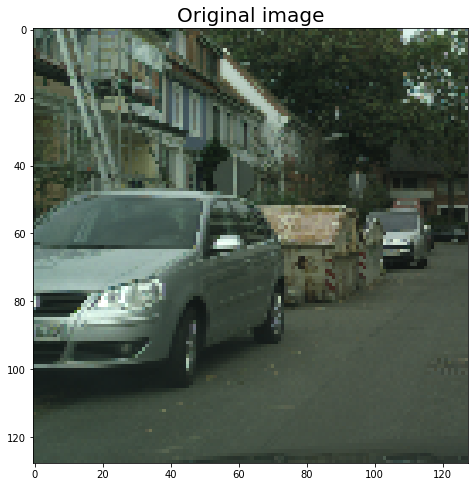

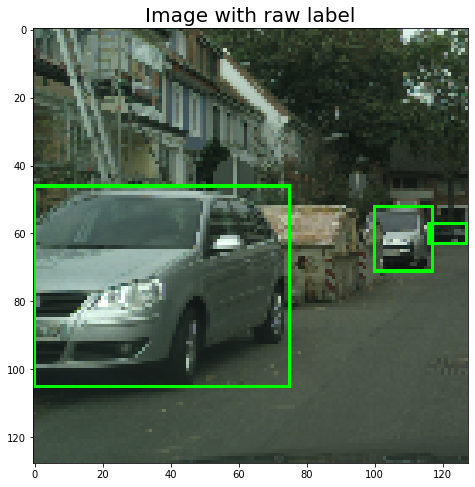

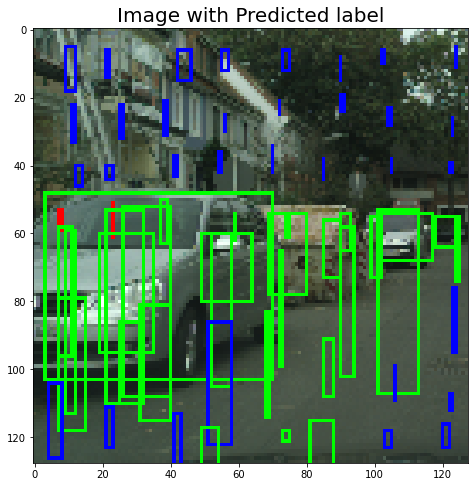

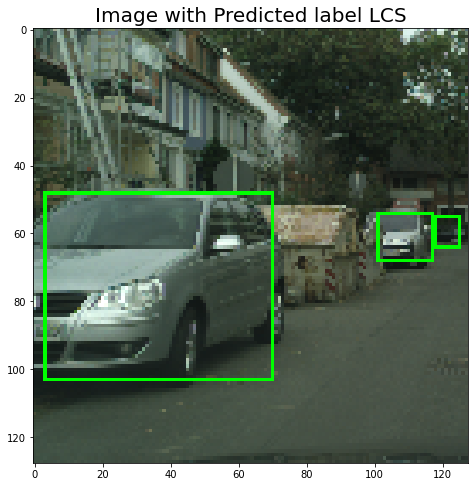

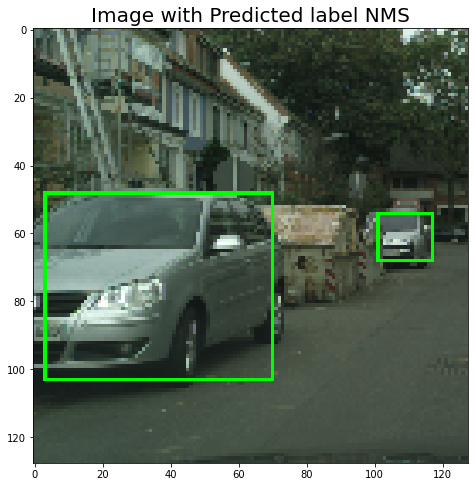

In [24]:
import cv2
# disp_img_number = img_number
disp_img_number = 42
"""
ORIGINAL IMAGE
"""
plt.figure(figsize = (8,8))
plt.title("Original image", size=20)
plt.imshow(images[disp_img_number])


"""
RAW LABELS
"""
image_orig_lab = images[disp_img_number].copy()

for i in range(0, len(raw_labels[disp_img_number])):
  x_ul = int(raw_labels[disp_img_number][i][1])
  y_ul = int(raw_labels[disp_img_number][i][2])

  x_br = int(raw_labels[disp_img_number][i][3])
  y_br = int(raw_labels[disp_img_number][i][4])

  # green car, red pedestrian, blue traffic light
  if(raw_labels[disp_img_number][i][0] == 0):
    color = (255,0,0)
  if(raw_labels[disp_img_number][i][0] == 1):
    color = (0,0,255)
  if(raw_labels[disp_img_number][i][0] == 2):
    color = (0,255,0)

  image_orig_lab = cv2.rectangle(image_orig_lab, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with raw label", size=20)
plt.imshow(image_orig_lab)


"""
RAW PREDICTIONS
"""

predict_lab = reconstruct_raw_labels([predictions[disp_img_number].detach().numpy()], conf=False, thr = 0.00, img_dim=128)
# print(predict_lab)
# print("   ")
# print(raw_labels[disp_img_number])
raw_pred_image = images[disp_img_number].copy()

for i in range(0, len(predict_lab[0])):
  # print(predict_lab[0])
  x_ul = int(predict_lab[0][i][1])
  y_ul = int(predict_lab[0][i][2])

  x_br = int(predict_lab[0][i][3])
  y_br = int(predict_lab[0][i][4])

  # green car, red pedestrian, blue traffic light
  if(predict_lab[0][i][0] == 0):
    color = (255,0,0)
  if(predict_lab[0][i][0] == 1):
    color = (0,0,255)
  if(predict_lab[0][i][0] == 2):
    color = (0,255,0)

  raw_pred_image = cv2.rectangle(raw_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label", size=20)
plt.imshow(raw_pred_image)


"""
LCS PREDICTIONS
"""
lab1 = low_confidence_suppression(predictions[disp_img_number])
# print(type(lab1))
# print((predictions[disp_img_number]))
# print((lab1))
# print(predictions[disp_img_number]==lab1)
lcs_label = reconstruct_raw_labels([lab1.detach().numpy()], conf=False, thr = 0.00, img_dim=128)
# print(np.shape(reconstruct_raw_labels([lab1.detach().numpy()], conf=False, thr = 0.00, img_dim=128)))
# print(np.shape(lcs_label))
lcs_pred_image = images[disp_img_number].copy()

for i in range(0, len(lcs_label[0])):
  # print(predict_lab[0])
  x_ul = int(lcs_label[0][i][1])
  y_ul = int(lcs_label[0][i][2])

  x_br = int(lcs_label[0][i][3])
  y_br = int(lcs_label[0][i][4])

  # green car, red pedestrian, blue traffic light
  if(lcs_label[0][i][0] == 0):
    color = (255,0,0)
  if(lcs_label[0][i][0] == 1):
    color = (0,0,255)
  if(lcs_label[0][i][0] == 2):
    color = (0,255,0)

  lcs_pred_image = cv2.rectangle(lcs_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label LCS", size=20)
plt.imshow(lcs_pred_image)

"""
NMS PREDICTIONS
"""
lab2 = low_confidence_suppression(predictions[disp_img_number])
nms_ = non_max_suppression(torch.tensor([lab2.detach().numpy()]), nms_thres=0.6)[0]

nms_123 = []
for x in range(0,len(nms_)):

  if len(nms_[x]) == 0:
    continue
  if len(nms_123) == 0:
    nms_123 = nms_[x]
    continue
  nms_123 = np.vstack((nms_123,nms_[x]))


nms_pred_image = images[disp_img_number].copy()
for i in range(0, len(nms_123)):

  x_ul = int(nms_123[i][1])
  y_ul = int(nms_123[i][2])

  x_br = int(nms_123[i][3])
  y_br = int(nms_123[i][4])
  # green car, red pedestrian, blue traffic light
  if(nms_123[i][0] == 0):
    color = (255,0,0)
  if(nms_123[i][0] == 1):
    color = (0,0,255)
  if(nms_123[i][0] == 2):
    color = (0,255,0)

  nms_pred_image = cv2.rectangle(nms_pred_image, (x_ul, y_ul), (x_br, y_br), color, 1)
plt.figure(figsize = (8,8))
plt.title("Image with Predicted label NMS", size=20)
plt.imshow(nms_pred_image)

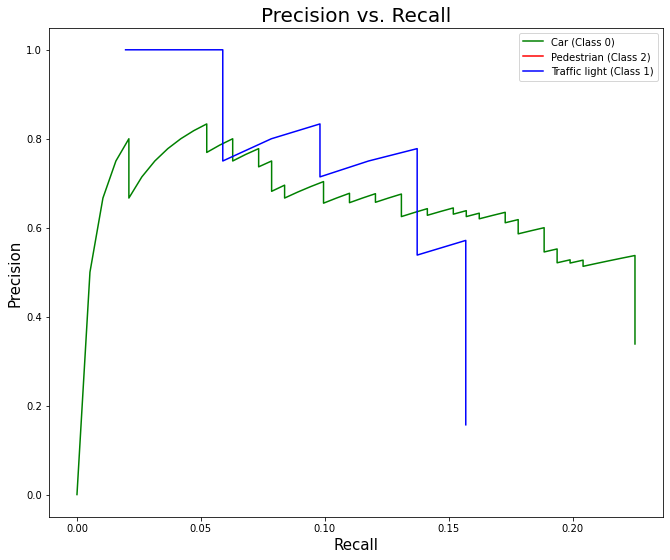

In [25]:
# green 0 car, red 2 pedestrian, blue 1 traffic light
pr_car, rec_car = precision_recall_curve(nms_res[:], raw_labels[:1000], 2)


pr_pedestrian, rec_pedestrian = precision_recall_curve(nms_res[:], raw_labels[:1000], 1)
 

pr_traffic_light, rec_traffic_light = precision_recall_curve(nms_res[:], raw_labels[:1000], 0)


fig = plt.figure(figsize =(11, 9))
plt.title("Precision vs. Recall", size=20)
plt.xlabel('Recall', size=15)
plt.ylabel('Precision', size =15)
plt.plot(pr_car, rec_car, label ="Car (Class 0)", color="green")
plt.plot(pr_pedestrian, rec_pedestrian, label = "Pedestrian (Class 2)", color="red")
plt.plot(pr_traffic_light, rec_traffic_light, label = "Traffic light (Class 1)", color="blue")
plt.legend(loc="upper right")
plt.show()

We faced a challenges while writing the loss function. The vectorization process was a bit tough for us and it took a bit of time. Getting the model to run properly and debugging was a little bit challenging. We had to play with the training parameters and the batch size to get the best optimal results. Writing the NMS and calculating the precision, recall was also a lot of challenging. We acheived an overall map of around 0.28. We can improve our performance by tweaking the loss function a little bit and playing with the paramaters. We can also run for more number of epochs to get a better trainied model. Increasing the dataset will also largely affect the model. 

## References

Original YOLO paper:  
https://arxiv.org/pdf/1506.02640.pdf

Intuitive Explanation:  
https://towardsdatascience.com/yolo-you-only-look-once-real-time-object-detection-explained-492dc9230006

YOLO Video Tutorial:  
https://www.youtube.com/watch?v=9s_FpMpdYW8&list=PLkDaE6sCZn6Gl29AoE31iwdVwSG-KnDzF&index=30

mean Average Precision:  
https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173

Intersection over Union:  
https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection

In [29]:
# !sudo apt-get update &> /dev/null
# !sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-generic-recommended &> /dev/null
# !jupyter nbconvert --to pdf YOLO.ipynb

In [28]:
torch.save(model.state_dict(), 'model.pth')

In [31]:
model = YOLO(learning_rate=0.001)
model.load_state_dict(torch.load('model.pth'))

<All keys matched successfully>